# Первоначальная обработка

In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt

from statsmodels.tsa.seasonal import seasonal_decompose, MSTL
from adtk.detector import QuantileAD
from scipy.stats import shapiro 
from scipy.stats import kstest

df = pd.read_csv('C:/Users/maksi/Downloads/anomaly_detection_data/anomaly_detection_data.csv')

df['event_timestamp'] = df['event_timestamp'].apply(lambda date_str: dt.datetime.strptime(date_str, '%Y-%m-%d %H:%M:%S'))

df = df.sort_values(by='event_timestamp')
df = df.reset_index(drop=True)

df['date'] = df['event_timestamp'].apply(lambda x: x.date())
df['week'] = df['event_timestamp'].apply(lambda x: x.isocalendar()[1])
df['month'] = df['event_timestamp'].apply(lambda x: x.month)

df['device_type'].fillna('NaN', inplace = True)

In [125]:
df

,event_name,event_timestamp,device_type,event_count,url_id,product_category_id,date,week,month
0,events.pageLoad,2023-07-31 21:00:00,HIGHEND_PHONE,1,612,3,2023-07-31,31,7
1,events.pageLoad,2023-07-31 21:00:00,HIGHEND_PHONE,1,1504,0,2023-07-31,31,7
2,events.pageLoad,2023-07-31 21:00:00,HIGHEND_PHONE,4,295,4,2023-07-31,31,7
3,events.pageLoad,2023-07-31 21:00:00,HIGHEND_PHONE,8,790,4,2023-07-31,31,7
4,events.pageLoad,2023-07-31 21:00:00,HIGHEND_PHONE,10,739,0,2023-07-31,31,7
...,...,...,...,...,...,...,...,...,...
6078200,events.pageLoad,2023-10-31 20:00:00,HIGHEND_PHONE,4,2066,0,2023-10-31,44,10
6078201,events.pageLoad,2023-10-31 20:00:00,HIGHEND_PHONE,1,827,2,2023-10-31,44,10
6078202,events.pageLoad,2023-10-31 20:00:00,HIGHEND_PHONE,2,43764,2,2023-10-31,44,10
6078203,events.pageLoad,2023-10-31 20:00:00,PERSONAL_COMPUTER,4,1408,0,2023-10-31,44,10


# Группировка по категории продукта

## Сумма событий

In [126]:
def get_product_event_count(df, product_num, axes):
    view = df[df['product_category_id'] == product_num].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']

    # временной ряд
    x = view.index

    # метки временной оси для графика
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    event_count = view.event_count
    result = MSTL(event_count, periods=[24*1, 24*7]).fit()
    residuals = result.resid[~result.resid.isna()].tolist()

    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])

    # для графика

    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)

    #fig, axes = plt.subplots(4, figsize=(100, 20), dpi=100)

    a = x[0]
    b = x[-1]

    axes[product_num].set_xlim(a, b)
    axes[product_num].set_xticks(sep)
    axes[product_num].set_xticklabels(labels)
    axes[product_num].grid()

    axes[product_num].plot(x, result.observed)
    axes[product_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[product_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[product_num].set_title(product_num, x=1.01, y=0.15, rotation = -90, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index


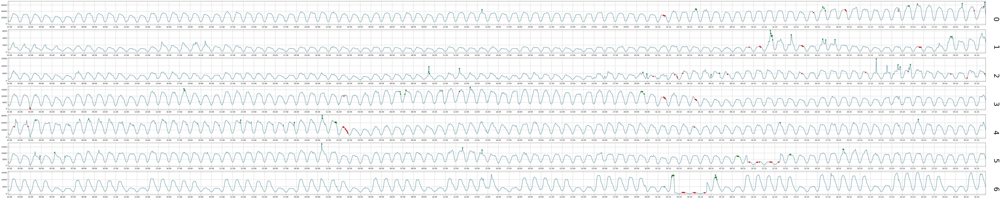

In [127]:
product_nums = df['product_category_id'].unique()
observed_low = [set() for i in range(len(product_nums))]
observed_high = [set() for i in range(len(product_nums))]
fig, axes = plt.subplots(len(product_nums), figsize=(100, 20), dpi=100)
for product_num in product_nums:
    low, high = get_product_event_count(df, product_num, axes)
    observed_low[product_num].update(low)
    observed_high[product_num].update(high)
plt.show()



Самые крупные аномалии:
30.08-01.09 - подъем и резкий спад по продуктам 4 и 5;
09.09, 12.09 - подъемы по продукту 2;
30.09, 08.10 - подъемы по продукту 2 в полночь;
02.10-07.10 - нарушение недельного цикла по продукту 6, в будние дни активность почти нулевая;
09.10-13.10 - аналогичное нарушение по продукту 5;
11.10, 13.10, 15.10, 16.10 - точечные подъемы на продукте 1. Активность в 2-3 раза выше обычной;
21.10-25.10 - точечные подъемы в течение дня на продукте 2.



## Среднее число событий на URL

In [128]:
def get_product_mean_urls(df, product_num, axes):
    view = df[df['product_category_id'] == product_num].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    events_per_url = view.events_per_url
    
    result = MSTL(events_per_url, periods=[24*1, 24*7]).fit()
    
    residuals = result.resid[~result.resid.isna()].tolist()
    
    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])
    
    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)
    
    a = x[0]
    b = x[-1]

    axes[product_num].set_xlim(a, b)
    axes[product_num].set_xticks(sep)
    axes[product_num].set_xticklabels(labels)
    axes[product_num].grid()

    axes[product_num].plot(x, result.observed)
    axes[product_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[product_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[product_num].set_title(product_num, x=1.01, y=0.15, rotation = -90, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index

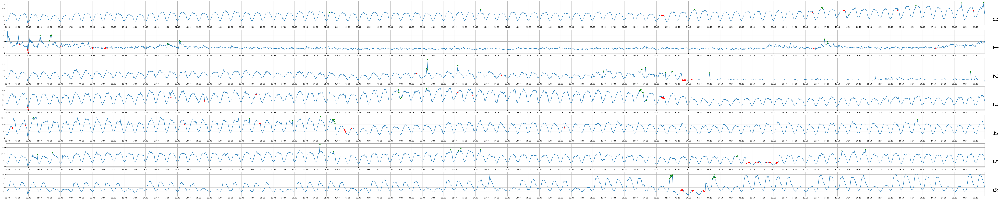

In [129]:
fig, axes = plt.subplots(len(product_nums), figsize=(100, 20), dpi=100)
for product_num in product_nums:
    low, high = get_product_mean_urls(df, product_num, axes)
    observed_low[product_num].update(low)
    observed_high[product_num].update(high)
plt.show()

Самые крупные аномалии:
01.08-06.08 - точечные спады и подъемы по продукту 1;
16.08, 19.08 - точечные спады в дневное время по продукту 3;
30.08-01.09 - подъем и резкий спад по продуктам 4 и 5;
09.09, 12.09 - точечные подъемы по продукту 2;
25.09-04.10 - искажение дневных циклов, после чего резкий спад активности до конца октября по продукту 2;
02.10-07.10 - нарушение недельного цикла по продукту 6;
08.10-13.10 - аналогичное нарушение по продукту 5.

## Сумма уникальных URL

In [130]:
def get_product_sum_unique_urls(df, product_num, axes):
    view = df[df['product_category_id'] == product_num].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    nunique_url_id = view.nunique_url_id
    
    result = MSTL(nunique_url_id, periods=[24*1, 24*7]).fit()
    
    residuals = result.resid[~result.resid.isna()].tolist()
    
    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])
    
    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)
    
    a = x[0]
    b = x[-1]

    axes[product_num].set_xlim(a, b)
    axes[product_num].set_xticks(sep)
    axes[product_num].set_xticklabels(labels)
    axes[product_num].grid()

    axes[product_num].plot(x, result.observed)
    axes[product_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[product_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[product_num].set_title(product_num, x=1.01, y=0.15, rotation = -90, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index


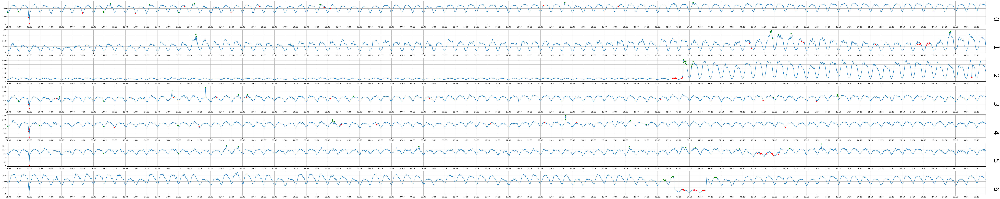

In [131]:
fig, axes = plt.subplots(len(product_nums), figsize=(100, 20), dpi=100)
for product_num in product_nums:
    low, high = get_product_sum_unique_urls(df, product_num, axes)
    observed_low[product_num].update(low)
    observed_high[product_num].update(high)
plt.show()

Самые крупные аномалии:
03.08 - точечный спад показателя до нуля почти на всех продуктах;
16.08, 19.08 - точечные подъемы по продукту 3;
18.08 - точечный подъем по продукту 1;
22.09 - точечный подъем по продукту 4;
03.10 - резкий подъем показателя по продукту 2 до конца октября;
02.10-06.10 - нарушение недельного цикла по продукту 6;
11.10, 28.10 - подъемы по продукту 1;
30.10 - точечный спад днем по продукту 2.

## Все найденные аномалии

In [132]:
def get_product_anomalies(df, product_num, observed_low, observed_high, axes):
    view = df[df['product_category_id'] == product_num].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]
    
    a = x[0]
    b = x[-1]

    axes[product_num].set_xlim(a, b)
    for datetime in observed_low:
        for i in range(len(x)):
            if x[i] == datetime:
                axes[product_num].axvline(x=x[i], color = 'r', linewidth=4)
    for datetime in observed_high:
        for i in range(len(x)):
            if x[i] == datetime:
                axes[product_num].axvline(x=x[i], color = 'g', linewidth=4)
    axes[product_num].set_title(product_num, x=1.04, y=0.25, fontsize=40)

    axes[product_num].set_xticks(sep)
    axes[product_num].set_xticklabels(labels)

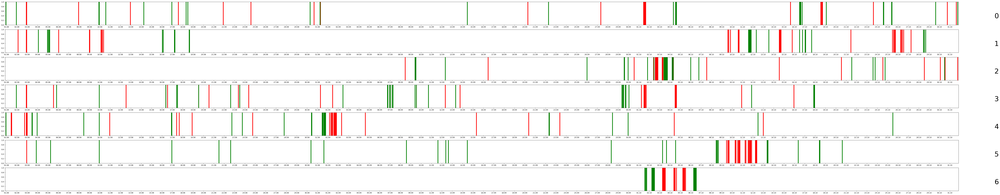

In [133]:
fig, axes = plt.subplots(len(product_nums), figsize=(100, 20), dpi=100)
for product_num in product_nums:
    get_product_anomalies(df, product_num, observed_low[product_num], observed_high[product_num], axes)
plt.show()

# Группировка по типу девайса

## Сумма событий

In [134]:
def get_device_event_count(df, device_type, device_type_num, axes):
    view = df[df['device_type'] == device_type].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    view = view.resample('1h').mean().fillna(0)

    # временной ряд
    x = view.index

    # метки временной оси для графика
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    event_count = view.event_count
    
    result = MSTL(event_count, periods=[24*1, 24*7]).fit()
    residuals = result.resid[~result.resid.isna()].tolist()

    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])

    # для графика

    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)

    #fig, axes = plt.subplots(4, figsize=(100, 20), dpi=100)

    a = x[0]
    b = x[-1]

    axes[device_type_num].set_xlim(a, b)
    axes[device_type_num].set_xticks(sep)
    axes[device_type_num].set_xticklabels(labels)
    axes[device_type_num].grid()

    axes[device_type_num].plot(x, result.observed)
    axes[device_type_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[device_type_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[device_type_num].set_title(device_type, x=1.05, y=0.15, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index

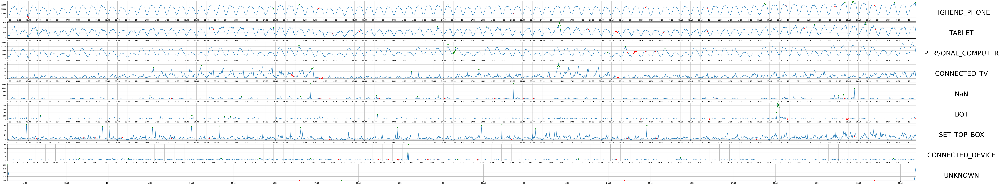

In [135]:
device_types = df['device_type'].unique()
observed_low = [set() for i in range(len(device_types))]
observed_high = [set() for i in range(len(device_types))]
fig, axes = plt.subplots(len(device_types), figsize=(100, 20), dpi=100)
for i, device_type in enumerate(device_types):
    low, high = get_device_event_count(df, device_type, i, axes)
    observed_low[i].update(low)
    observed_high[i].update(high)
plt.show()

Самые крупные аномалии:
Регулярные точечные подъемы по девайсу SET_TOP_BOX;
По девайсу CONNECTED_TV подъем к концу месяца и спад 1 числа каждого месяца;
31.08, 21.09 - точечные подъемы по девайсу NaN (не заполнен);
10.09 - точечный подъем по девайсу CONNECTED_DEVICE;
17.10-18.10 - подъем по девайсу BOT.

## Среднее число событий на URL

In [136]:
def get_device_mean_urls(df, device_type, device_type_num, axes):
    view = df[df['device_type'] == device_type].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    view = view.resample('1h').mean().fillna(0)
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    events_per_url = view.events_per_url
    
    result = MSTL(events_per_url, periods=[24*1, 24*7]).fit()
    
    residuals = result.resid[~result.resid.isna()].tolist()
    
    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])
    
    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)
    
    a = x[0]
    b = x[-1]

    axes[device_type_num].set_xlim(a, b)
    axes[device_type_num].set_xticks(sep)
    axes[device_type_num].set_xticklabels(labels)
    axes[device_type_num].grid()

    axes[device_type_num].plot(x, result.observed)
    axes[device_type_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[device_type_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[device_type_num].set_title(device_type, x=1.05, y=0.15, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index

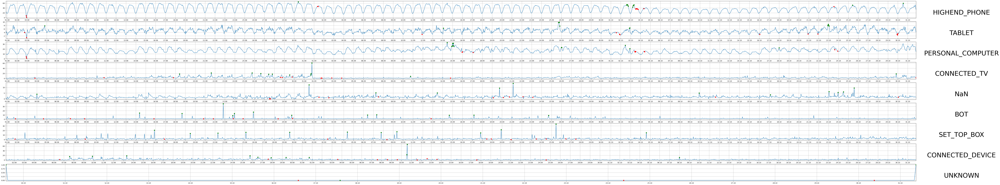

In [137]:
fig, axes = plt.subplots(len(device_types), figsize=(100, 20), dpi=100)
for i, device_type in enumerate(device_types):
    low, high = get_device_mean_urls(df, device_type, i, axes)
    observed_low[i].update(low)
    observed_high[i].update(high)
plt.show()

## Сумма уникальных URL

In [138]:
def get_device_sum_unique_urls(df, device_type, device_type_num, axes):
    view = df[df['device_type'] == device_type].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    view = view.resample('1h').mean().fillna(0)
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]

    nunique_url_id = view.nunique_url_id
    
    result = MSTL(nunique_url_id, periods=[24*1, 24*7]).fit()
    
    residuals = result.resid[~result.resid.isna()].tolist()
    
    quantile_ad = QuantileAD(high=0.995, low=0.005)
    anomalies = quantile_ad.fit_detect(result.resid[~result.resid.isna()])
    
    avg = np.mean(result.resid)

    highlight_observed_low = {}
    highlight_observed_high = {}
    for datetime in result.observed.index:
        if np.isnan(result.resid[datetime]):
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_observed_low[datetime] = np.nan
            highlight_observed_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_observed_low[datetime] = result.observed[datetime]
                highlight_observed_high[datetime] = np.nan
            else:
                highlight_observed_low[datetime] = np.nan
                highlight_observed_high[datetime] = result.observed[datetime]
    highlight_observed_low = pd.Series(highlight_observed_low)
    highlight_observed_high = pd.Series(highlight_observed_high)

    highlight_residual_low = {}
    highlight_residual_high = {}
    for datetime in result.resid.index:
        if np.isnan(result.resid[datetime]):
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        elif not anomalies[datetime]:
            highlight_residual_low[datetime] = np.nan
            highlight_residual_high[datetime] = np.nan
        else:
            if result.resid[datetime] < avg:
                highlight_residual_low[datetime] = result.resid[datetime]
                highlight_residual_high[datetime] = np.nan
            else:
                highlight_residual_low[datetime] = np.nan
                highlight_residual_high[datetime] = result.resid[datetime]
    highlight_residual_low = pd.Series(highlight_residual_low)
    highlight_residual_high = pd.Series(highlight_residual_high)
    
    a = x[0]
    b = x[-1]

    axes[device_type_num].set_xlim(a, b)
    axes[device_type_num].set_xticks(sep)
    axes[device_type_num].set_xticklabels(labels)
    axes[device_type_num].grid()

    axes[device_type_num].plot(x, result.observed)
    axes[device_type_num].scatter(x, highlight_observed_low, s=30, c='r', zorder=10)
    axes[device_type_num].scatter(x, highlight_observed_high, s=30, c='g', zorder=10)
    axes[device_type_num].set_title(device_type, x=1.05, y=0.15, fontsize=40)
    
    return highlight_observed_low[highlight_observed_low.notna()].index, highlight_observed_high[highlight_observed_high.notna()].index

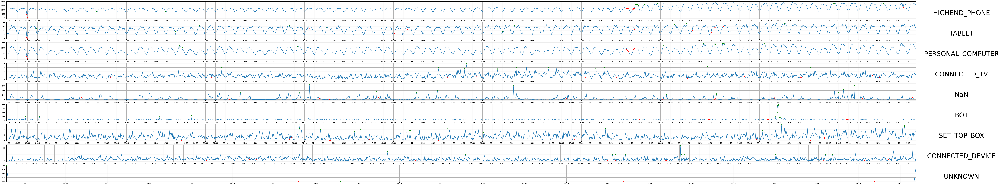

In [139]:
fig, axes = plt.subplots(len(device_types), figsize=(100, 20), dpi=100)
for i, device_type in enumerate(device_types):
    low, high = get_device_sum_unique_urls(df, device_type, i, axes)
    observed_low[i].update(low)
    observed_high[i].update(high)
plt.show()

## Все найденные аномалии

In [140]:
def get_device_anomalies(df, device_type, device_type_num, observed_low, observed_high, axes):
    view = df[df['device_type'] == device_type].groupby(['event_timestamp']).agg({'event_count':'sum','url_id':'nunique', 'week':'min', 'month':'min'})
    view.rename(columns={'url_id':'nunique_url_id'}, inplace=True)
    view['events_per_url'] = view['event_count'] / view['nunique_url_id']
    
    x = view.index
    sep = [datetime for datetime in view.index if datetime.hour==0]
    labels = [s.strftime('%d.%m') for s in sep]
    
    a = x[0]
    b = x[-1]

    axes[device_type_num].set_xlim(a, b)
    for datetime in observed_low:
        for i in range(len(x)):
            if x[i] == datetime:
                axes[device_type_num].axvline(x=x[i], color = 'r', linewidth=4)
    for datetime in observed_high:
        for i in range(len(x)):
            if x[i] == datetime:
                axes[device_type_num].axvline(x=x[i], color = 'g', linewidth=4)
    axes[device_type_num].set_title(device_type, x=1.04, y=0.25, fontsize=40)

    axes[device_type_num].set_xticks(sep)
    axes[device_type_num].set_xticklabels(labels)

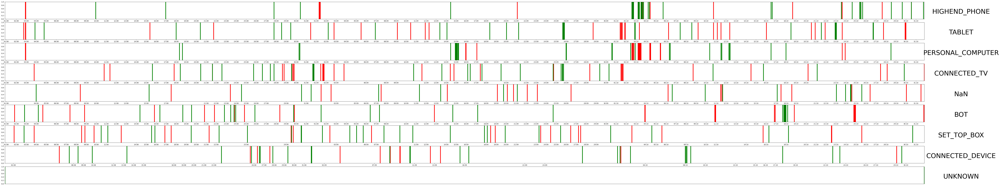

In [141]:
fig, axes = plt.subplots(len(device_types), figsize=(100, 20), dpi=100)
for i, device_type in enumerate(device_types):
    get_device_anomalies(df, device_type, i, observed_low[i], observed_high[i], axes)
plt.show()

# Анализ периодов

Август-сентябрь. В середине месяца происходит подъем показателей, в начале - спад. Такая же ситуация наблюдается при отдельном рассмотрении некоторых продуктов и девайсов, так что период можно считать нормальным. Для понимания причины такой цикличности, вероятно, нужна информация о продуктах. 

Октябрь. Общее число событий растет. Число событий, приходящихся на URL упало. Число уникальных URL растет.
При рассмотрении отдельных продуктов обнаружен следующий момент: по продукту 2 резко выросло число уникальных URL (примерно в 5 раз). Возможно, это связано с созданием новых URL по продукту 2, проведением рекламной кампании по этому продукту. Активность при этом суммарно выросла, но распределилась по новым URL, поэтому средняя активность по URL упала.